In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px

In [4]:
nvidia=pd.read_csv('DataSets/Stock Price/NVIDIA (1999-2023).csv')
asus=pd.read_csv('DataSets/Stock Price/ASUS (2000-2023).csv')
intel=pd.read_csv('DataSets/Stock Price/Intel (1980-2023).csv')
amd=pd.read_csv('DataSets/Stock Price/AMD (1980-2023).csv')
msi=pd.read_csv('DataSets/Stock Price/MSI (1962-2023).csv')

In [5]:
nvidia_stats = nvidia['Close'].describe()
asus_stats = asus['Close'].describe()
intel_stats = intel['Close'].describe()
amd_stats = amd['Close'].describe()
msi_stats = msi['Close'].describe()

print("NVIDIA statistics:\n", nvidia_stats)
print('\n')
print("ASUS statistics:\n", asus_stats)
print('\n')
print("Intel statistics:\n", intel_stats)
print('\n')
print("AMD statistics:\n", amd_stats)
print('\n')
print("MSI statistics:\n", msi_stats)

NVIDIA statistics:
 count    6094.000000
mean       31.003835
std        59.881405
min         0.341146
25%         2.670208
50%         4.290000
75%        26.818125
max       333.760010
Name: Close, dtype: float64


ASUS statistics:
 count    5686.000000
mean      290.132960
std        75.978864
min       130.196335
25%       234.000000
50%       277.500000
75%       331.007599
max       565.188538
Name: Close, dtype: float64


Intel statistics:
 count    10859.000000
mean        19.833531
std         17.514300
min          0.216146
25%          1.328125
50%         20.280001
75%         29.950001
max         74.875000
Name: Close, dtype: float64


AMD statistics:
 count    10859.000000
mean        16.648080
std         22.196357
min          1.620000
25%          5.265000
50%          9.760000
75%         16.000000
max        161.910004
Name: Close, dtype: float64


MSI statistics:
 count    15424.000000
mean        45.825400
std         54.222402
min          0.845884
25%          

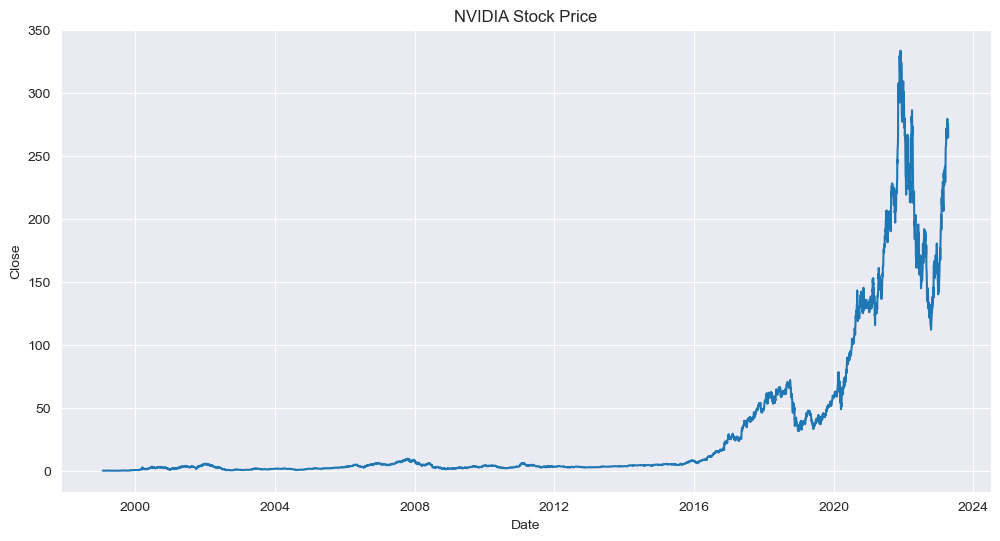

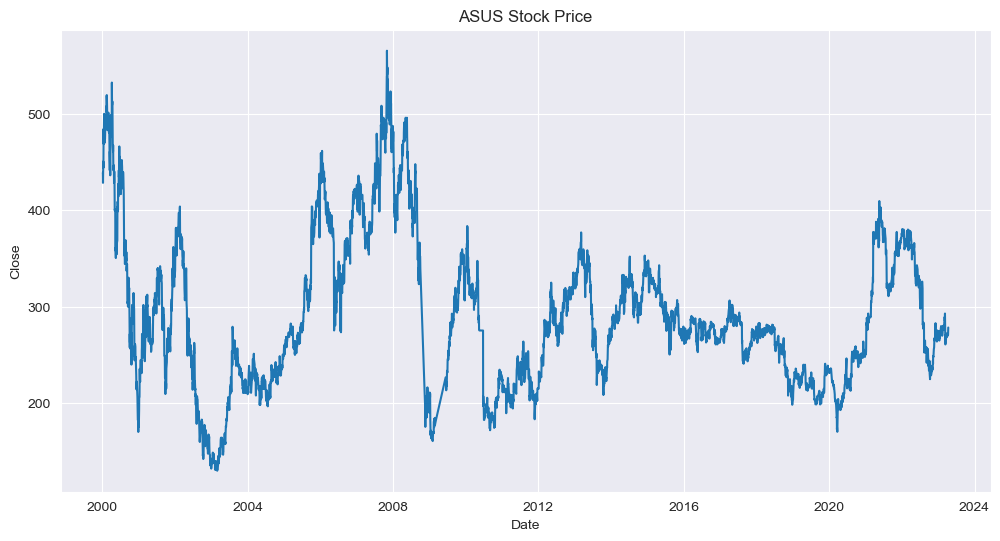

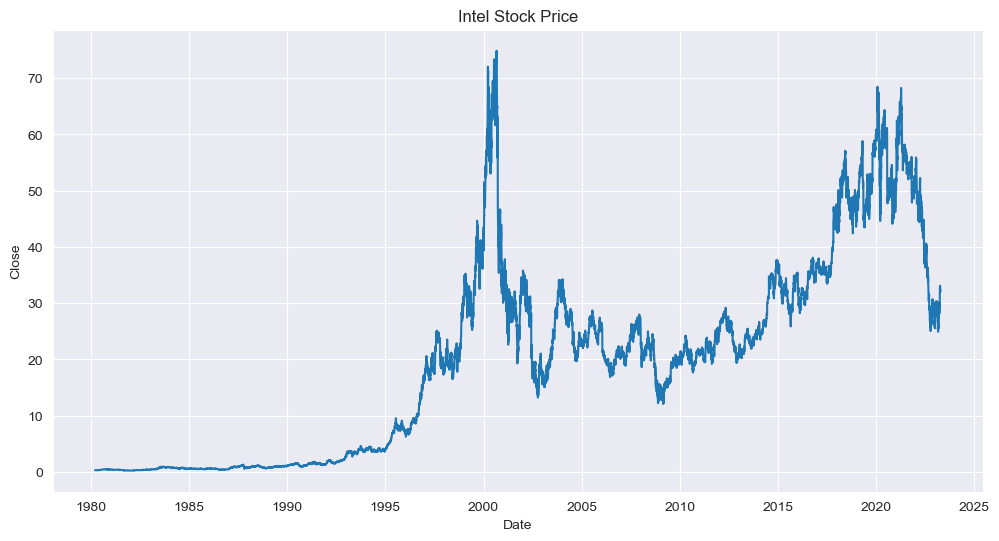

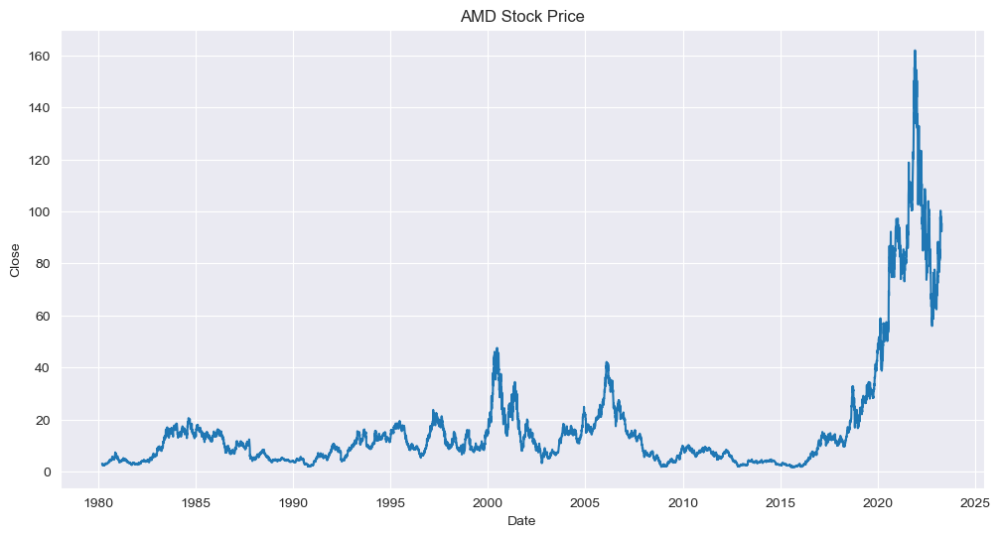

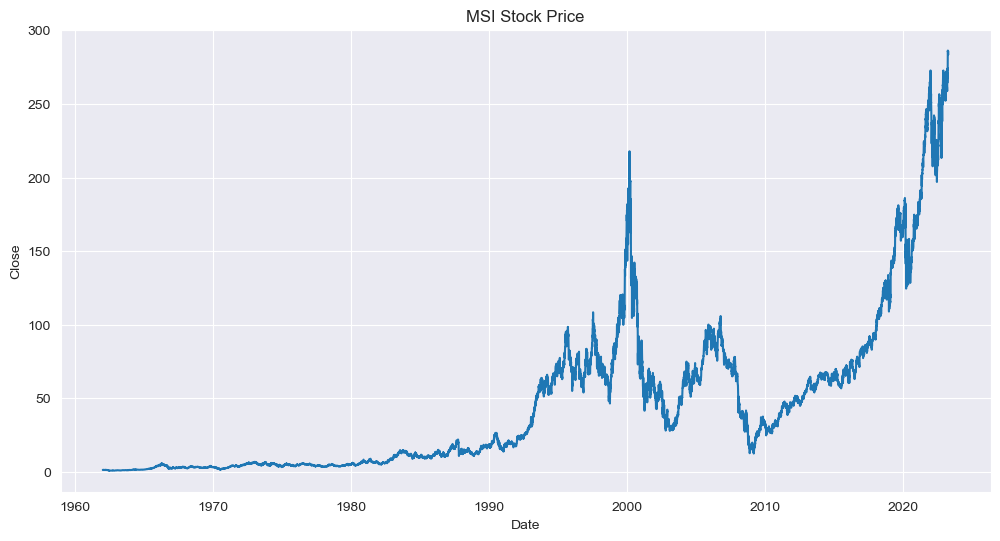

In [6]:
# Convert the date columns to datetime format
nvidia['Date'] = pd.to_datetime(nvidia['Date'])
asus['Date'] = pd.to_datetime(asus['Date'])
intel['Date'] = pd.to_datetime(intel['Date'])
amd['Date'] = pd.to_datetime(amd['Date'])
msi['Date'] = pd.to_datetime(msi['Date'])

# Create interactive plots for each company using Plotly
nvidia_fig = px.line(nvidia, x='Date', y='Close', title='NVIDIA Stock Price')
asus_fig = px.line(asus, x='Date', y='Close', title='ASUS Stock Price')
intel_fig = px.line(intel, x='Date', y='Close', title='Intel Stock Price')
amd_fig = px.line(amd, x='Date', y='Close', title='AMD Stock Price')
msi_fig = px.line(msi, x='Date', y='Close', title='MSI Stock Price')

# Display the interactive plots
nvidia_fig.show()
asus_fig.show()
intel_fig.show()
amd_fig.show()
msi_fig.show()

# Create static plots using Seaborn
sns.set_style('darkgrid')
plt.figure(figsize=(12,6))
sns.lineplot(data=nvidia, x='Date', y='Close')
plt.title('NVIDIA Stock Price')
plt.show()

plt.figure(figsize=(12,6))
sns.lineplot(data=asus, x='Date', y='Close')
plt.title('ASUS Stock Price')
plt.show()

plt.figure(figsize=(12,6))
sns.lineplot(data=intel, x='Date', y='Close')
plt.title('Intel Stock Price')
plt.show()

plt.figure(figsize=(12,6))
sns.lineplot(data=amd, x='Date', y='Close')
plt.title('AMD Stock Price')
plt.show()

plt.figure(figsize=(12,6))
sns.lineplot(data=msi, x='Date', y='Close')
plt.title('MSI Stock Price')
plt.show()

In [7]:
nvidia_data = go.Scatter(x=nvidia['Date'], y=nvidia['Close'], name='NVIDIA')
asus_data = go.Scatter(x=asus['Date'], y=asus['Close'], name='ASUS')
intel_data = go.Scatter(x=intel['Date'], y=intel['Close'], name='Intel')
amd_data = go.Scatter(x=amd['Date'], y=amd['Close'], name='AMD')
msi_data = go.Scatter(x=msi['Date'], y=msi['Close'], name='MSI')


layout = go.Layout(title='Comparison of Stock Price Trends Between Companies', xaxis=dict(title='Date'), yaxis=dict(title='Closing Price'))
fig = go.Figure(data=[nvidia_data, asus_data, intel_data, amd_data, msi_data], layout=layout)
fig.show()

NVIDIA daily growth rate: 0.0017693931691676289
ASUS daily growth rate: 0.0001998318800012276
Intel daily growth rate: 0.0007381772323386972
AMD daily growth rate: 0.001018269002494248
MSI daily growth rate: 0.0006146981679750937


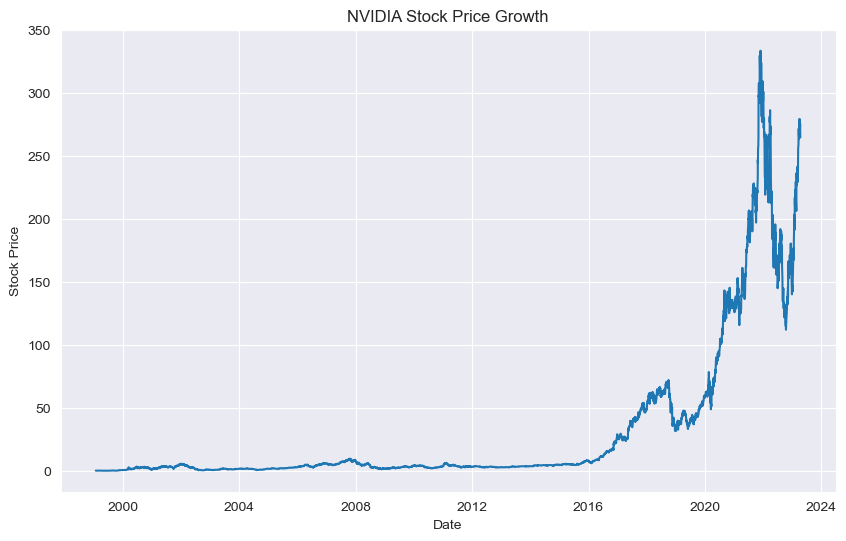

In [8]:
nvidia_pct_change = nvidia['Close'].pct_change()
asus_pct_change = asus['Close'].pct_change()
intel_pct_change = intel['Close'].pct_change()
amd_pct_change = amd['Close'].pct_change()
msi_pct_change = msi['Close'].pct_change()

print('NVIDIA daily growth rate:', nvidia_pct_change.mean())
print('ASUS daily growth rate:', asus_pct_change.mean())
print('Intel daily growth rate:', intel_pct_change.mean())
print('AMD daily growth rate:', amd_pct_change.mean())
print('MSI daily growth rate:', msi_pct_change.mean())

growth_rates = [nvidia_pct_change.mean(), asus_pct_change.mean(), intel_pct_change.mean(), amd_pct_change.mean(), msi_pct_change.mean()]
highest_growth_rate_index = growth_rates.index(max(growth_rates))

if highest_growth_rate_index == 0:
    company = nvidia
    company_name = 'NVIDIA'
elif highest_growth_rate_index == 1:
    company = asus
    company_name = 'ASUS'
elif highest_growth_rate_index == 2:
    company = intel
    company_name = 'Intel'
elif highest_growth_rate_index == 3:
    company = amd
    company_name = 'AMD'
else:
    company = msi
    company_name = 'MSI'

fig, ax = plt.subplots(figsize=(10,6))
ax.plot(company['Date'], company['Close'])
ax.set_xlabel('Date')
ax.set_ylabel('Stock Price')
ax.set_title(f'{company_name} Stock Price Growth')
plt.show()

### find the years in which the companies experienced a significant increase in stock prices:¶

In [9]:
# # def find_significant_years(df):
#     df['pct_change'] = df['Close'].pct_change()
#     # Find the years with significant increase in stock prices
#     significant_years = df[df['pct_change'] > 0.5]['Date'].apply(lambda x: str(x)[:4])
#     return significant_years

# significant_years = {}
# for company, df in stocks.items():
#     significant_years[company] = find_significant_years(df)
#     print(f'{company}: {list(significant_years[company])}')

# fig, ax = plt.subplots(figsize=(10, 6))
# for i, (company, years) in enumerate(significant_years.items()):
#     ax.scatter([i] * len(years), years, s=100, alpha=0.7, label=company)
# ax.set_xticks(range(len(stocks)))
# ax.set_xticklabels(list(stocks.keys()))
# ax.set_xlabel('Company')
# ax.set_ylabel('Year')
# ax.set_title('Significant Years with Increase in Stock Prices')
# ax.legend()
# plt.show()

Thank you for following along with this notebook exploring stock prices of NVIDIA, ASUS, and Intel. I hope you found it informative and interesting.

Due to time constraints, I have to stop here for now, but I plan to continue exploring this dataset further in the future. Feel free to check back for updates or to build on what we've covered here.

Happy coding!